# Advanced Lane Finding

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Apply a perspective transform to rectify binary image (*"birds-eye view"*).
4. Use color transforms, gradients, etc., to create a thresholded binary image.
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center (warp the image back to original to see the lane estimation)
7. Display numerical estimation of lane curvature and vehicle position in the image
8. Create a pipeline and process video

**NOTE:** *After number 3, we repeat  2 and 3 with car images rather than testing with chessboards. This is to allow the proper behavior of our piepeline's perpespective transform for lane projection.* 

---
## 1. Camera Calibration

The first step is to calibrate the camera with a set of chessboard pictures. This is done to find the distortion coefficients and the camera intrinsic parameters.

We need to find the critical points(corners of chessboard squares) in the images, so we can find the camera calibration parameters.

Number of images used for camera calibration: 20


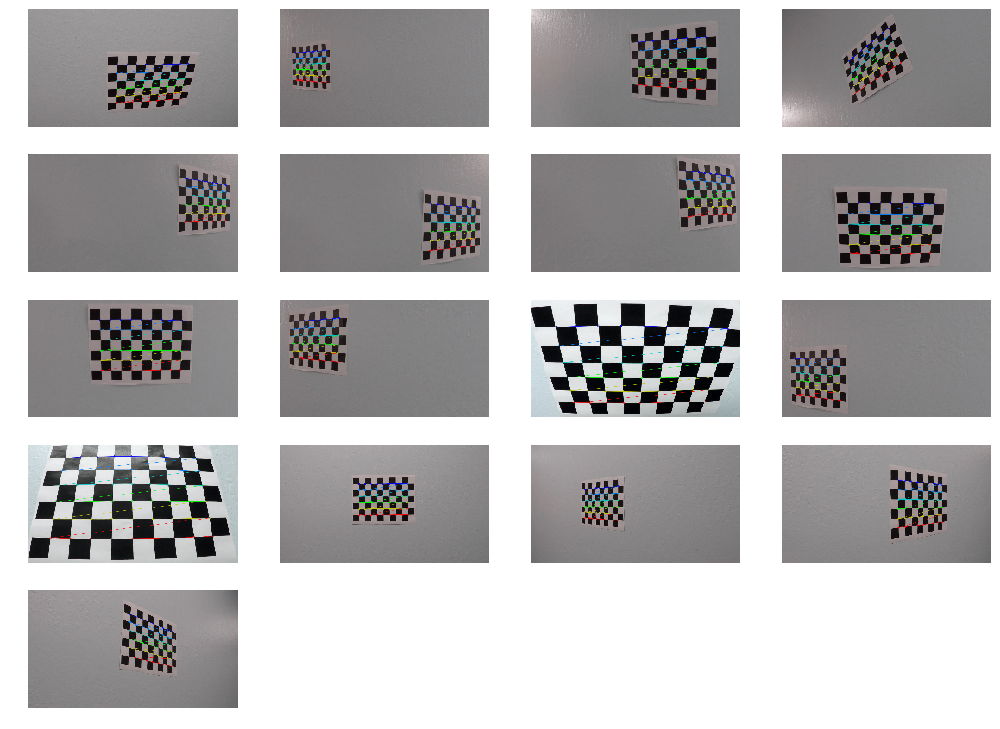

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec

%matplotlib qt
%matplotlib inline

def loadImage(pathImage='test_images/straigth_lines1.jpg'):
    #Load an image
    img = mpimg.imread(pathImage)
    return img

def show_images(images, n_range=3, n_rows = 1, n_columns=3):
    """
    Displays Images
    Arguments:
    @image: Dataset of images
    @n_range: number of images to display
    """
    grid1 = gridspec.GridSpec(n_rows, n_columns)
    grid1.update(wspace=0.1, hspace=0.1) # set the spacing between axes.
    plt.figure(figsize=(20,15))
    for i in range(n_range):
        ax1 = plt.subplot(grid1[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        img = images[i]
        #img = transform_image(image,20,10,5,brightness=1)

        plt.subplot(n_rows,n_columns,i+1)
        plt.imshow(img)
        plt.axis('off')

    plt.show()


# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
print('Number of images used for camera calibration: {}'.format(len(images)))

# Step through the list and search for chessboard corners
img_corners = []
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        
        #Fine tune the finding of corners
        cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        img_corners.append(img)
        #cv2.imshow('img',img)
        #plt.imshow(img)
        #cv2.waitKey(500)
show_images(img_corners,len(img_corners),5,4)
        
cv2.destroyAllWindows()


Camera calibartion using the points found on the images

In [2]:
ret, cam_matrix, distortion_coef, rot_vecs, trans_vecs = cv2.calibrateCamera(\
                                                                              objpoints, imgpoints, gray.shape[::-1],\
                                                                              None, None)

## 2. Undistorting Images

Once we have the distortion coefficients and camera parameters, it is possible to undistort images taken with the calibrated camera.

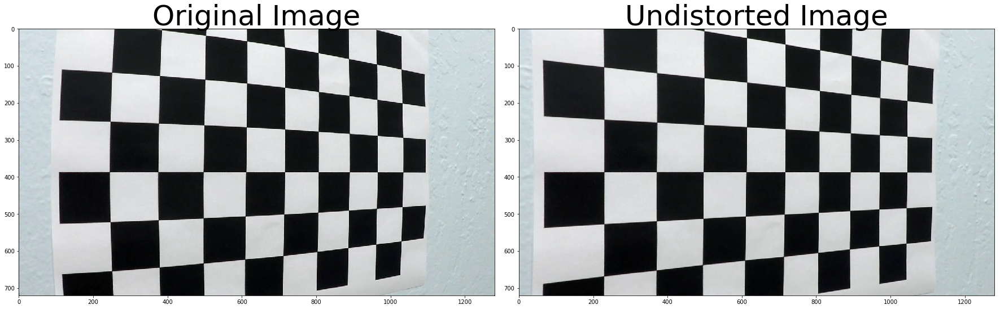

In [3]:
def undistortImage(img, cam_matrix, distortion_coef):
    undist_img = cv2.undistort(img, cam_matrix, distortion_coef, None, cam_matrix)
    return undist_img

def compare2img(img1, img2, title_img2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1,cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title_img2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img = cv2.imread(images[15])
undistorted = undistortImage(img, cam_matrix, distortion_coef)
compare2img(img, undistorted, 'Undistorted Image')


## 3. Perspective Transform Matrix

After the distortion coefficients are obtained, one can start thinking about image processing techniques.

For lane finding, the curvature is a challenging factor to be detected. That leads to find a way of calculating the curvature from the image. However, the lines of the lanes are flat on the ground and the perspective of the camera on board of a car doesn't help to find curvature. For this scenario, it is very helpful to do a perspective transform and look at the lane lines from the top. This transformation is usually called the "birds-eye view". In order to be able to transform images in this way we need to first obtain the perspective transformation matrix through a selection of points in the image and a desired position of such points after a transformation is applied.

In here we use the chessboard image to do a test and obtain a transformation matrix. Then we will use the same approach for images of the actual road with the car's onboard camera.

For the chessboard approach we will:
1. Undistort the image using cv2.undistort() with mtx and dist
2. Convert to grayscale
3. Find the chessboard corners
4. Draw corners
5. Define 4 source points (the outer 4 corners detected in the chessboard pattern)
6. Define 4 destination points (must be listed in the same order as src points!)
7. Use cv2.getPerspectiveTransform() to get M, the transform matrix
8. Use cv2.warpPerspective() to apply M and warp your image to a top-down view

p1 [[ 481.1590271   240.56211853]]	d1 [100, 100]
p2 [[ 481.47976685  429.14904785]]	d2 [100, 620]
p3 [[ 785.18469238  237.71669006]]	d3 [1180, 100]
p4 [[ 785.74829102  428.08459473]]	d4 [1180, 620]


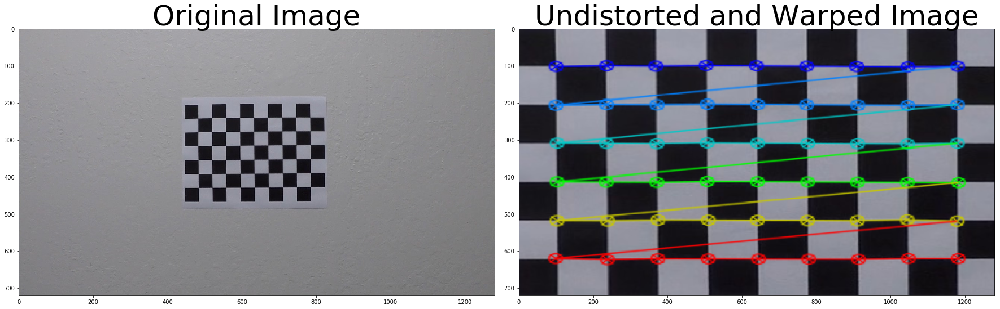

In [4]:


# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist_img = cv2.undistort(img,mtx,dist,None,mtx)
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist_img,cv2.COLOR_BGR2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)
    # 4) If corners found:
    M = None
    warped = np.copy(img) 
    if ret == True:
        # a) draw corners
        cv2.drawChessboardCorners(undist_img, (nx, ny), corners, ret)
        # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
     
        s1 = corners[0]
        s2 = corners[-nx]
        s3 = corners[nx-1]
        s4 = corners[-1]
        src = np.float32([s1,s2,s3,s4])
                 #Note: you could pick any four of the detected corners 
                 # as long as those four corners define a rectangle
                 #One especially smart way to do this would be to use four well-chosen
                 # corners that were automatically detected during the undistortion steps
                 #We recommend using the automatic detection of corners in your code
        # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        
        img_size = (img.shape[1], img.shape[0])
        offset = 100
        d1 = [0+offset, 0+offset]
        d3 = [img.shape[1]-offset,0+offset]
        d2 = [0+offset,img.shape[0]-offset]
        d4 = [img.shape[1]-offset,img.shape[0]-offset]
        
        print('p1 {}\td1 {}'.format(s1,d1))
        print('p2 {}\td2 {}'.format(s2,d2))
        print('p3 {}\td3 {}'.format(s3,d3))
        print('p4 {}\td4 {}'.format(s4,d4))
      
        
        dst = np.float32([d1,d2,d3,d4])
        
        
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        
        # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # e) use cv2.warpPerspective() to warp your image to a top-down view
        
        warped = cv2.warpPerspective(undist_img, M, img_size, flags=cv2.INTER_LINEAR)
    #delete the next two lines
    #img = warped
    #warped = np.copy(img) 
    return warped, M


def getPerspectiveTransformMatrix(img):

    # define source points
    # some automation on getting these points
    #src = np.float32( [ [,] , [,] , [,] ...] )
    
    # define destination points
    # some automation on getting these points
    #dst = np.float32( [ [,] , [,] , [,] ...] )

    perspective_matrix = cv2.getPerspectiveTransform(src, dst)
    
    return perspective_matrix


def warpImage(img, perspective_matrix):
    #Images coordinate system is backwards (img_max_x,img_max_y) = (typical_max_x, -typical_max_y)
    img_size = (img.shape[1], img.shape[0]) 
    warped_image = cv2.warpPerspective(img, perspective_matrix, img_size, flags=cv2.INTER_LINEAR)
    #warped_image = cv2.flip(warped_image,1)

    return warped_image

nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
img = loadImage(images[16]) #16
top_down, perspective_M = corners_unwarp(img, nx, ny, cam_matrix, distortion_coef)
compare2img(img, top_down, 'Undistorted and Warped Image')


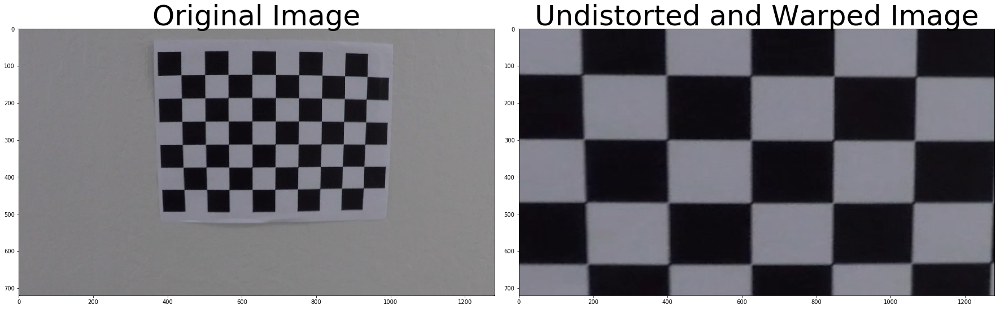

In [5]:
img = loadImage(images[9])
undistorted = undistortImage(img, cam_matrix, distortion_coef)
warped_img = warpImage(undistorted, perspective_M )
compare2img(img, warped_img, 'Undistorted and Warped Image')

### 3.1. Processing Pictures from Onboard Cameras 

Once we calibrated the camera and proved the perspective transformed is works for chessboard, we can start using pictures from the cameras onboard the car.

Number of image locations loaded: 2
Number of test image locations loaded: 6


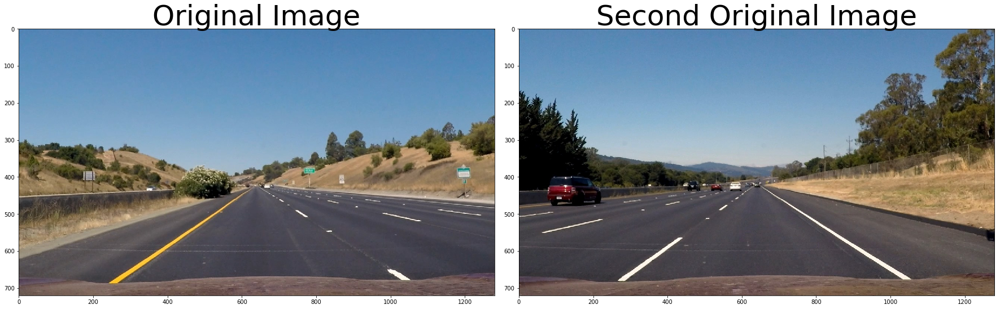

In [6]:
# Make a list of images
straight_line_images = glob.glob('./test_images/straight_lines*.jpg')
print('Number of image locations loaded: {}'.format(len(straight_line_images)))
test_imgs = glob.glob('./test_images/test*.jpg')
print('Number of test image locations loaded: {}'.format(len(test_imgs)))
img1 = loadImage(straight_line_images[0])
img2 = loadImage(straight_line_images[1])
test_img1 = loadImage(test_imgs[0])
test_img2 = loadImage(test_imgs[1])
compare2img(img1, img2, 'Second Original Image')

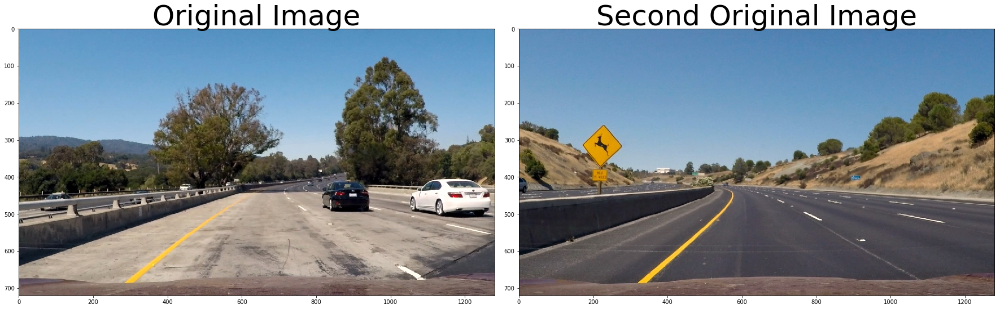

In [7]:
compare2img(test_img1, test_img2, 'Second Original Image')

### 3.2. Undistort Car Images

Since the camera calibration has already been proved to be working on the chessboard, it is good to observe the effects of undistortion in the car images before moving forward.

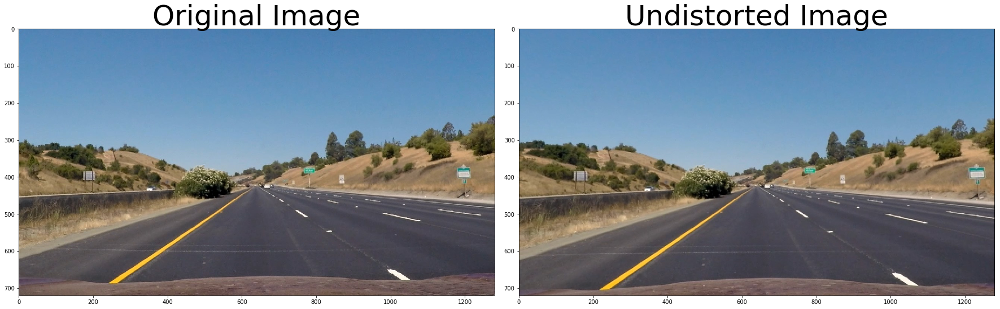

In [8]:
undistorted_straight_lines1 = undistortImage(img1, cam_matrix, distortion_coef)
compare2img(img1, undistorted_straight_lines1,'Undistorted Image')

### 3.3. Perspective Transform

Once the distortion is done we can move to calculate a perspective transform from the current picture to a top view of the road to vidualize if the lanes are curving. In order to do so, we need to find the points that will define the perspective transform


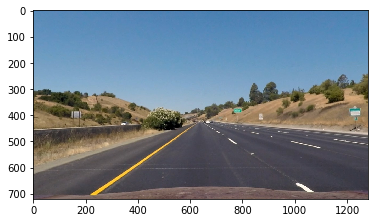

In [9]:
#Apply Polygon area windowing - ROI
image_shape = undistorted_straight_lines1.shape
window_vertices = np.array([[(20,image_shape[0]+(image_shape[0]//17)),\
                                 (image_shape[1]//2 -50, (image_shape[0]//2)+ (image_shape[0]//2)//5),\
                                 (image_shape[1]//2 +50 , (image_shape[0]//2)+ (image_shape[0]//2)//5),\
                                 (image_shape[1], image_shape[0]+(0*image_shape[0]//20))]],\
                                 dtype=np.int32)

#mask = np.zeros_like(undistorted_straight_lines1)
#ignore_mask_color = 255
#cv2.fillPoly(mask, window_vertices, ignore_mask_color)

img = np.array(undistorted_straight_lines1)
# Shows the ROI in the original Image
#cv2.polylines(undistorted_straight_lines1, window_vertices ,True, (0,0,255), 5)
plt.imshow(undistorted_straight_lines1); #,cmap='gray')

[[  20  762]
 [ 590  432]
 [ 690  432]
 [1280  720]]
(720, 1280)
[[   20.   720.]
 [ -620. -1200.]
 [ 1920. -1200.]
 [ 1280.   720.]]


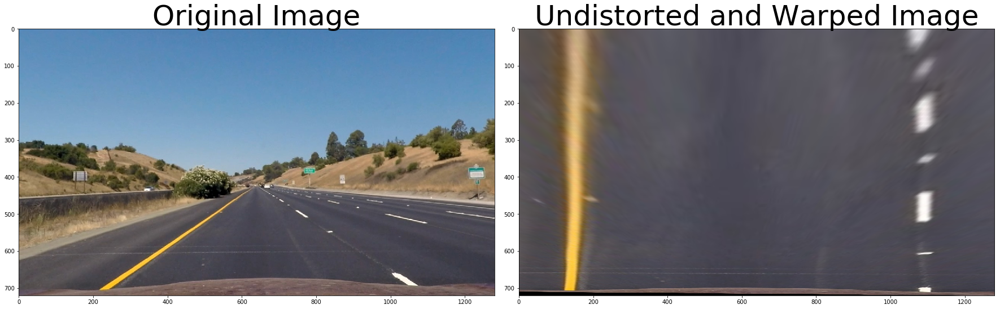

In [10]:


src = np.float32(window_vertices) 
h,w = img.shape[:2]

print(window_vertices[0])

p1x, p1y = window_vertices[0][0]
p2x, p2y = window_vertices[0][1]
p3x, p3y = window_vertices[0][2]
p4x, p4y = window_vertices[0][3]

src = np.float32([[p1x,p1y-0],[p2x,p2y],[p3x,p3y],[p4x,p4y-0]]) 

#dst = np.float32([[p1x//2,h],[p1x//2-(w//4),0],[p4x//2+(w//4),0],[p4x//2,h]])
dst = np.float32([[p1x,h],[p1x-(w//2),-1200],[p4x+(w//2),-1200],[p4x,h]])

#works!!
#dst = np.float32([[p1x,h],[p1x-(w//2),-1500],[p4x+(w//2),-1500],[p4x,h]])


print(img.shape[:2])
print(dst)
# d) use cv2.getPerspectiveTransform() to get M, the transform matrix
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
# e) use cv2.warpPerspective() to warp your image to a top-down view
warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)

compare2img(img, warped,'Undistorted and Warped Image')

## 4. Color Thresholding

After the perspective view is giving successful transformations, the next step will be to threshold the image and detect the lanes. The approach in here is using color thresholding by converting the RGB image into HLS and finding the right values to detect the lanes.

In [11]:
def colorFilteringHLS(image):
    
     #filtering by HSL
    img_hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS) 
    
    yellow = np.uint8([[[255,255,0 ]]])
    white = np.uint8([[[250,250,250 ]]])
    hls_y = cv2.cvtColor(yellow,cv2.COLOR_BGR2HLS)
    hls_w = cv2.cvtColor(white,cv2.COLOR_BGR2HLS)
    #print(hls_y)
    #print(hls_w)
    
    #Color segmentation
    upper_yellow = np.array([255,255,255])#255,220,255
    low_yellow = np.array([60,1,105])#60,28,165
    
    upper_white = np.array([255,255,255]) # 0,255,0
    low_white = np.array([80,200,0])#0,210,0
    
    
    #ORIGINAL VALUES
    #upper_yellow = np.array([255,220,255])#255,220,255
    #low_yellow = np.array([60,28,105])#60,28,165
    
    #upper_white = np.array([255,255,255]) # 0,255,0
    #low_white = np.array([0,210,0])#0,210,0
    
    
    yellow_mask = cv2.inRange(img_hls, low_yellow, upper_yellow)
    white_mask = cv2.inRange(img_hls,low_white, upper_white)
    
    color_mask = cv2.bitwise_or(yellow_mask,white_mask)
    img_color_masked = cv2.bitwise_and(image,image,mask = color_mask) 
  
    return img_color_masked

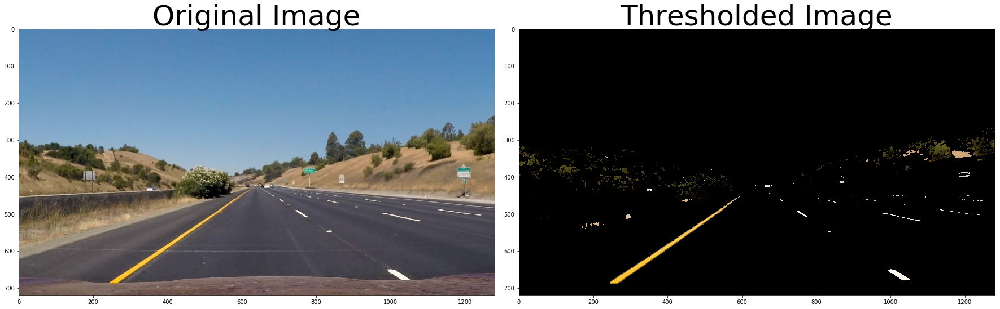

In [12]:
thres_img = colorFilteringHLS(img1)
compare2img(img1, thres_img, 'Thresholded Image')

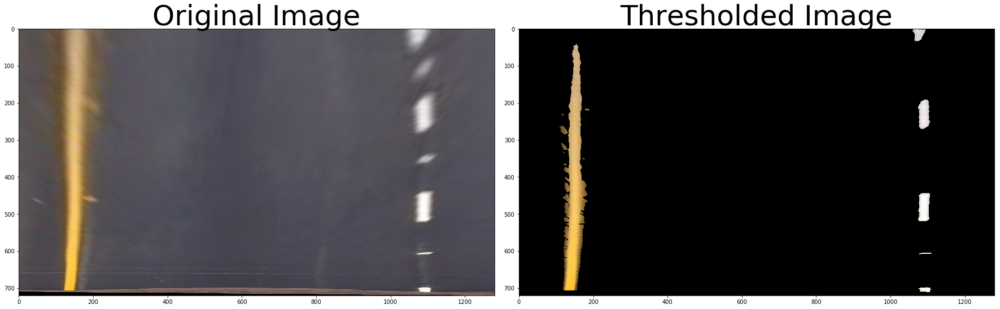

In [13]:
thres_img = colorFilteringHLS(warped)
compare2img(warped, thres_img, 'Thresholded Image')

In [14]:
#thres_img = colorFilteringHLS(img2)
#compare2img(img2, thres_img, 'Thresholded Image')

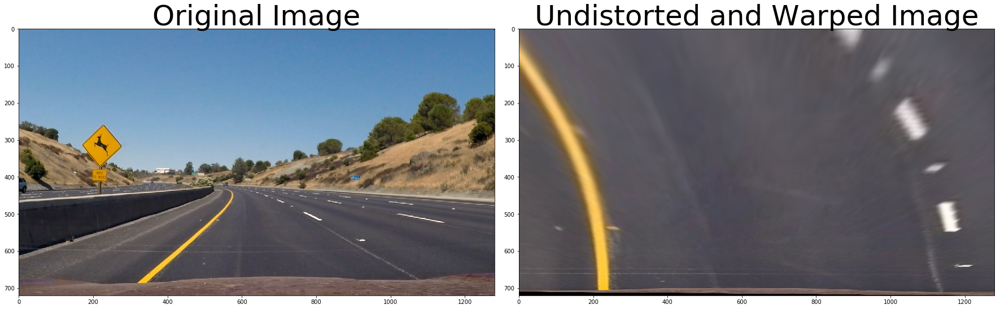

In [15]:
undist_test_img = undistortImage(test_img2, cam_matrix, distortion_coef)
warped2 = cv2.warpPerspective(undist_test_img, M, (w,h), flags=cv2.INTER_LINEAR)
compare2img(test_img2, warped2,'Undistorted and Warped Image')

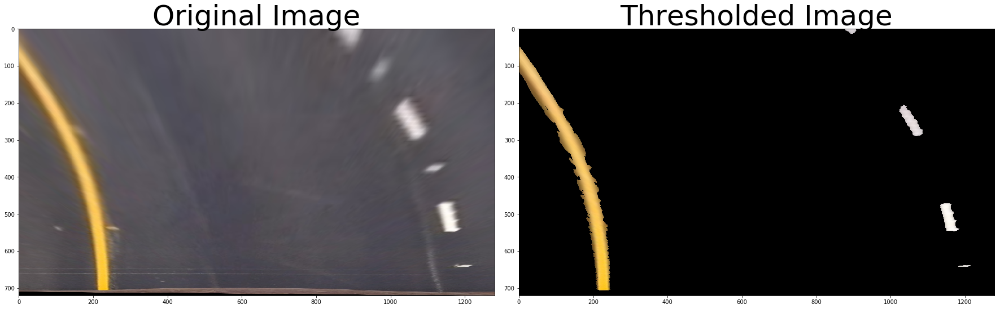

In [16]:
thres_img2 = colorFilteringHLS(warped2)
compare2img(warped2, thres_img2, 'Thresholded Image')

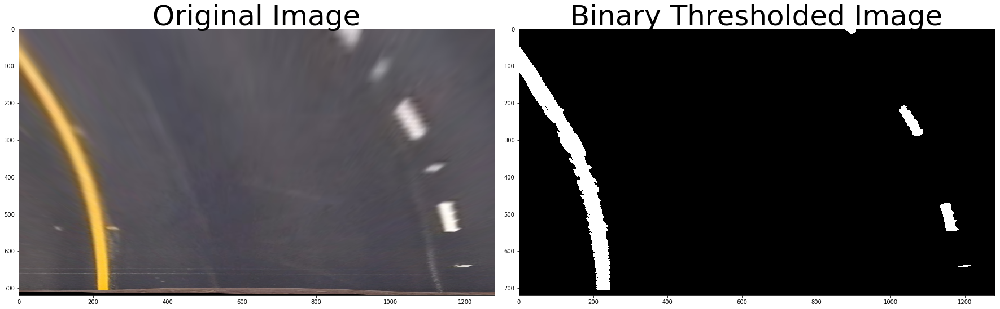

In [17]:
def makeBinImg(img):
    bin_img = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #bin_img = np.zeros_like(gray_img)
    bin_img[bin_img > 0] = 1
    return bin_img

bin_img = makeBinImg(thres_img2)
compare2img(warped2, bin_img, 'Binary Thresholded Image')

## 5. Sliding Window Polyfit

Once we are capable of undistort, change perspective from top-down of lanes and segment the lanes, we need to find the curvature of the lanes and for that we will use a sliding window method based on pixels histogram of a binary image of the segmented lanes.

This sliding window was taken from [Udacity's Self-Driving Car Program](https://www.udacity.com/)

Left  Curve Equation: -0.00061x^2 + (0.83891)x +(-61.49462) 
Right Curve Equation: -0.00031x^2 + (0.62448)x +(917.72324) 


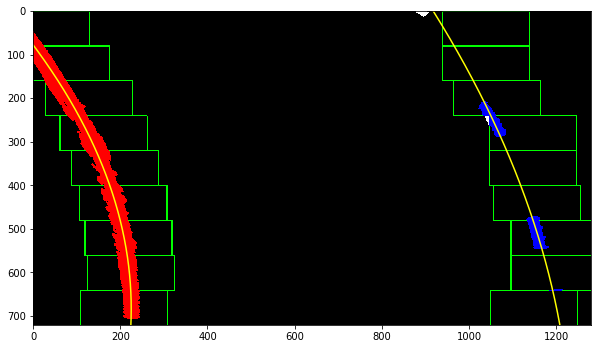

In [18]:

def polyfitSlidingWindow(binary_warped_image, showFigure=False):
    binary_warped = binary_warped_image
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    # At this point, you're done! But here is how you can visualize the result as well:
    # Generate x and y values for plotting
    if showFigure:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Identify the x and y positions of all nonzero pixels in the image
        #nonzero = binary_warped.nonzero()
        #nonzeroy = np.array(nonzero[0])
        #nonzerox = np.array(nonzero[1])
        # Create an output image to draw on and  visualize the result
        #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        plt.figure(figsize=(10,15))
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds
    
left_fit, right_fit, left_lane_inds, right_lane_inds = polyfitSlidingWindow(bin_img, True)
#plotSlidingWindowPolyfit(bin_img, left_fit, right_fit, left_lane_inds, right_lane_inds, True)

print('Left  Curve Equation: {:.5f}y^2 + ({:.5f})y +({:.5f}) '.format(left_fit[0], left_fit[1], left_fit[2]))
print('Right Curve Equation: {:.5f}y^2 + ({:.5f})y +({:.5f}) '.format(right_fit[0], right_fit[1], right_fit[2]))

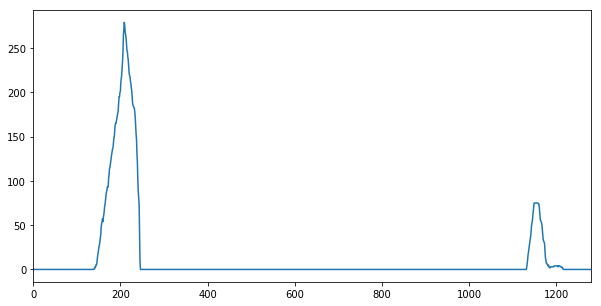

In [19]:
def plotHistogram(binary_warped_image):
    histogram = np.sum(binary_warped_image[binary_warped_image.shape[0]//2:,:], axis=0)
    plt.figure(figsize=(10,5))
    plt.plot(histogram)
    plt.xlim(0, 1280)
    
    
plotHistogram(bin_img)

## 6. Calculate Curvature and Car Position in the Lane

In [20]:
#Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30.0/720.0 #LANE LENGTH #3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/700.0 #LANE WIDTH maybe 30.0/900 is better (900 pixels width) 
    #3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
        # Calculate average curvature
        lane_avg_curvature = (left_curverad + right_curverad)/2.0
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, lane_avg_curvature, center_dist

In [21]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

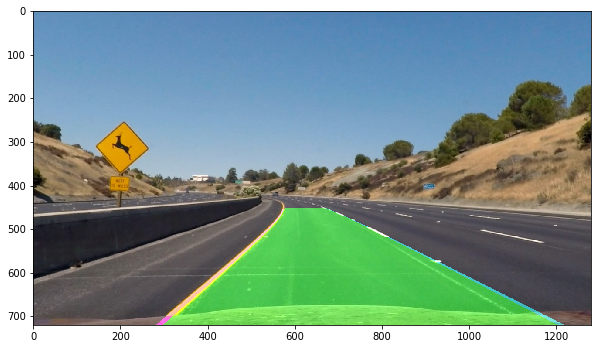

In [22]:
exampleImg = undist_test_img
exampleImg_out1 = draw_lane(exampleImg, bin_img, left_fit, right_fit, Minv)
plt.figure(figsize=(10,15))
plt.imshow(exampleImg_out1);

## 7. Curvature and Car's Position Display 

In [23]:
def display_data(image, curv_rad, center_dist):
    new_img = np.copy(image)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_COMPLEX
    text = 'Lane Curvature is ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (159, 249, 224), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'RIGHT'
    elif center_dist < 0:
        direction = 'LEFT'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (159, 249, 224), 2, cv2.LINE_AA)
    #cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

Radius of curvature for example: 267.558799427 m, 535.740279256 m
Curvature 401.64953934131233 m
Distance from lane center for example: -0.403353184952 m


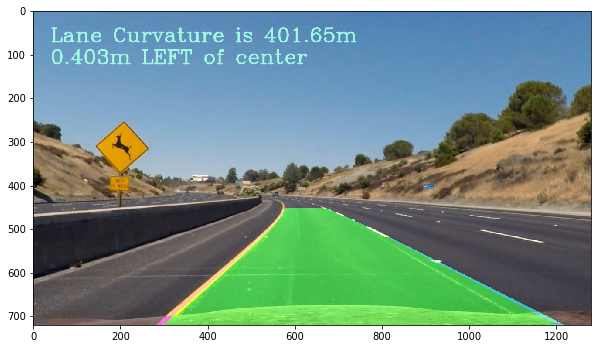

In [24]:
exampleImg = undist_test_img
exampleImg1 = draw_lane(exampleImg, bin_img, left_fit, right_fit, Minv)
rad_l, rad_r, lane_curvature, d_center = calc_curv_rad_and_center_dist(bin_img, left_fit, right_fit, left_lane_inds, right_lane_inds)
final_image = display_data(exampleImg1, lane_curvature, d_center)
plt.figure(figsize=(10,15))
plt.imshow(final_image);


print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Curvature {} m'.format(lane_curvature))
print('Distance from lane center for example:', d_center, 'm')

## 8. Pipeline

In [25]:
def detectLanes(image):
    
    undist_image = undistortImage(image, cam_matrix, distortion_coef)
    image = cv2.warpPerspective(undist_image, M, (w,h), flags=cv2.INTER_LINEAR)
    thres_img = colorFilteringHLS(image)
    bin_img = makeBinImg(thres_img)
    left_fit, right_fit, left_lane_inds, right_lane_inds = polyfitSlidingWindow(bin_img)
    polyfit_img = draw_lane(undist_image, bin_img, left_fit, right_fit, Minv)
    rad_l, rad_r, lane_curvature, d_center = calc_curv_rad_and_center_dist(bin_img, left_fit,\
                                                                           right_fit, left_lane_inds,\
                                                                           right_lane_inds)
    data_img = display_data(polyfit_img, lane_curvature, d_center)
    final_image = data_img
    
    return final_image

In [26]:
def pipeline(image):
    
    result = detectLanes(image)
    
    return result

### 8.1. Pipeline in Images

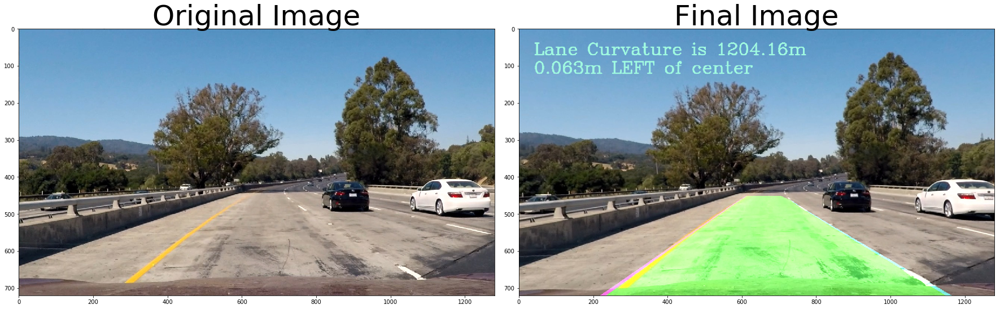

In [27]:
img = pipeline(test_img1)
compare2img(test_img1, img,'Final Image')

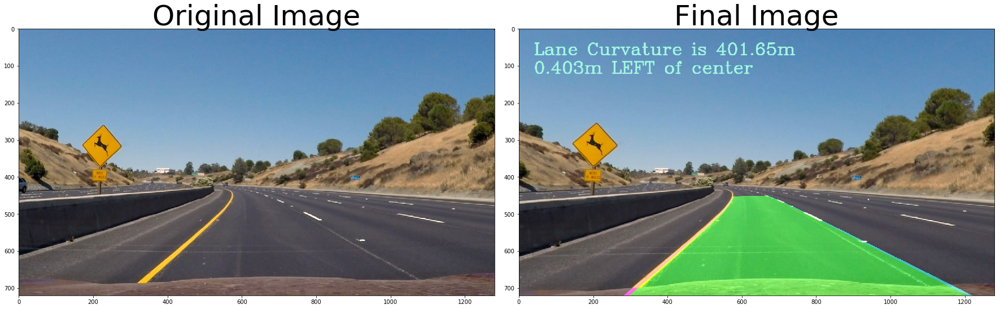

In [28]:
img = pipeline(test_img2)
compare2img(test_img2, img,'Final Image')

### 8.2. Pipeline in Video

In [29]:
#Download ffmpeg for video support
import imageio
imageio.plugins.ffmpeg.download()

# create test_videos_output directory
!mkdir test_videos_output

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

mkdir: test_videos_output: File exists


Trying the first video

In [30]:
def processVideo(video_file, video_file_output, image_process_pipeline):
    clip1 = VideoFileClip(video_file)
    project_clip = clip1.fl_image(image_process_pipeline) #NOTE: fl_image() expects color images
    %time project_clip.write_videofile(video_file_output, audio=False)

In [31]:
project_video = './test_videos/project_video.mp4'
project_video_output = './test_videos_output/project_video.mp4'

processVideo(project_video, project_video_output, pipeline)

[MoviePy] >>>> Building video ./test_videos_output/project_video.mp4
[MoviePy] Writing video ./test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [02:57<00:00,  6.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./test_videos_output/project_video.mp4 

CPU times: user 3min 31s, sys: 17.4 s, total: 3min 48s
Wall time: 2min 58s


Show the video obtained from the image processing pipeline

In [32]:
HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>

    """.format(project_video_output)
    )

## Future Work 

The pipeline was tested in an environment a bit aggresive for the conditions of the road. However, there are harder conditions to account for such us glaring due to strong sunlight or lack of light, for example when driving below a bridge. Examples of the previous cases are shown in the videos below. 
In order to make the proposed pipeline more robust one should account for the previous cases. We will leave that for future work since we only intended to introduce the basis for a robust pipeline.

In [33]:
challenge_video1 = './test_videos/challenge_video.mp4'
challenge_video1_output = './test_videos_output/challenge_video.mp4'

#processVideo(challenge_video1, challenge_video1_output, pipeline)

In [34]:
HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>
    """.format(challenge_video1)#challenge_video1_output)
    )

In [35]:
challenge_video1 = './test_videos/harder_challenge_video.mp4'
challenge_video1_output = './test_videos_output/harder_challenge_video.mp4'

#processVideo(challenge_video1, challenge_video1_output, pipeline)

In [36]:
HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>
    """.format(challenge_video1)#challenge_video1_output)
    )